#  Design contours

In [1]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from natsort import natsorted


sys.path.append(os.path.dirname(os.getcwd()))
from GRIDGEN.src import get_arrays as ga
from GRIDGEN.src import contours 
from GRIDGEN.src import masks
from GRIDGEN.src.mask_properties import GetMasksProperties

define the logger :  can be None, and is set to INFO

In [2]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

Get the files

In [3]:
xenium_path =  '../../xenium_data/HLA/GD_TMA1_S3/fov_filtered'

to_exclude = ['TMA1_Selection15_filtered.csv', 'TMA1_Selection24_filtered.csv', # tonsil
            'TMA1_Selection18_filtered.csv', 'TMA2_Selection11_filtered.csv' # normal
             ]
files_tma1 = os.listdir(xenium_path)
# Adding the full path to each file
files = [os.path.join(xenium_path, file) for file in files_tma1 if file not in to_exclude]
print(len(files_tma1))

27


put here how a file is

# 1. Define Tumour Border  based on density of genes

This intends to based on defined genes to find tumour areas and empty areas.
The stroma/other is defined as the area that is not empty and not tumour. 

We need to define: 

1. Parameters for tumour contours
    * Genes to consider :
  Use the marker genes of the gene list with log fold changes for epithelial cells
  
    * density
    * minimum area
    * kernel size
    
    this will define for an overlapping area with "kernel size" * "kernel_size" a minimum number of "density" genes of interest. The contiguous area of the contour will have at least "minimum area" 
 
2. Parameters for emptyness contours
    * density
    * minimum area
    * kernel size
   this will define for an overlapping area with "kernel size" * "kernel_size" a maximum number of "density"/ counts of all genes. The contiguous area of the contour will have at least "minimum area" 

In [4]:
# defined with the gene list f
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 

# param tum
density_th_tum = 25    # 50
min_area_th_tum =  500 #1000     check how much is a cell 
kernel_size_tum = 20   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 50 #400
kernel_size_empty = 10



density_th_tum = 25    # 50
min_area_th_tum = 200
kernel_size_tum = 20   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 400
kernel_size_empty = 10


../../xenium_data/HLA/GD_TMA1_S3/fov_filtered/TMA1_Selection25_filtered.csv
n genes: 480
shape: 1935, 1785
n hits 4210232
==== tumour ====
total contours found  334
total contours after filtering by area 38
====
total contours found  246
total contours after filtering by area 9


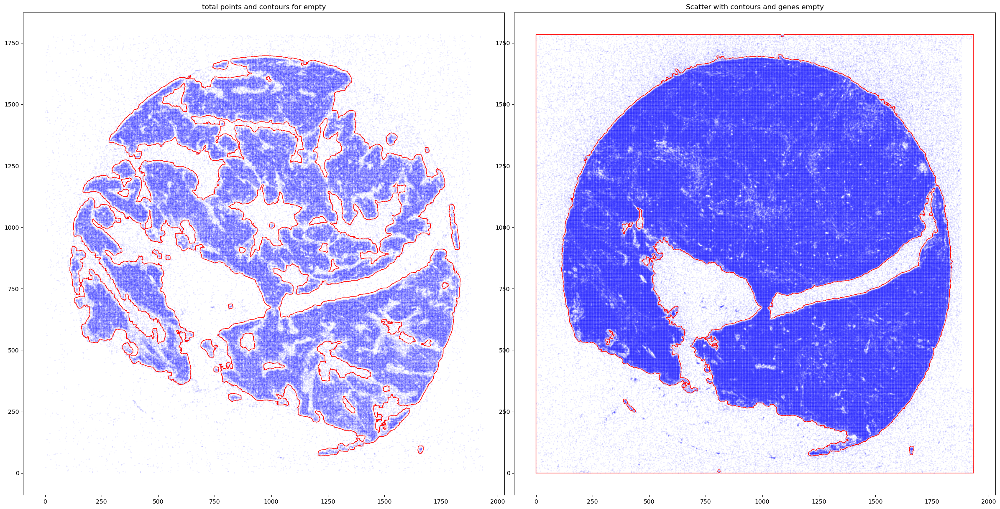

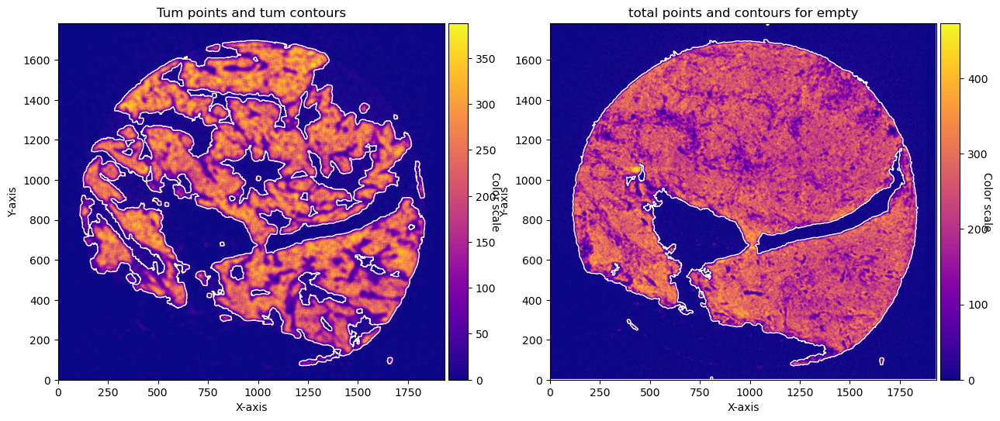

In [5]:
# we will do for a single file 
file_csv = files[7]
print(file_csv)
df_total = pd.read_csv(file_csv)
df_total = df_total[['x_location', 'y_location', 'feature_name']]
df_total = df_total.rename(columns={'feature_name': 'target'})
df_total = df_total[~df_total['target'].str.contains('System|egative')]
df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

n_genes = len(df_total['target'].unique())
height = int(max(df_total['X'])) + 1
width = int(max(df_total['Y'])) + 1

print(f'n genes: {n_genes}')
print(f'shape: {height}, {width}')
print(f'n hits {len(df_total)}')

# this makes the sparse df to an array with the spatial information 
target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
array_total = ga.transform_df_to_array(df = df_total, target_dict=target_dict_total, array_shape = (height, width,len(target_dict_total))).astype(np.int8)

# creating subsets 
df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(df_total, array_total,target_dict_total,
                                                                     target_list=target_tum, target_col = 'target')

# obtain contours 
CTum = contours.GetContour(array_subset_tum, contour_name='tum')
CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
CTum.contours_from_sum(density_threshold = density_th_tum,
                       min_area_threshold = min_area_th_tum , directionality = 'higher')

CEmpty = contours.GetContour(array_total, contour_name='empty')
CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
CEmpty.contours_from_sum(density_threshold = density_th_empty,
                       min_area_threshold = min_area_th_empty, directionality = 'lower') # attention that directionality is lower here 

print('==== tumour ====')
print('total contours found ', CTum.total_valid_contours)
print('total contours after filtering by area', CTum.contours_filtered_area)

print('====')
print('total contours found ', CEmpty.total_valid_contours)
print('total contours after filtering by area', CEmpty.contours_filtered_area)

# PLOTs -- instead of plotting just with the function for example: CTum.plot_contours_scatter, we will make a composite image 

fig, axs = plt.subplots(1, 2, figsize=(30, 15))
CTum.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[0])
axs[0].set_title('Tum points and tum contours')  


CEmpty.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[1])
axs[0].set_title('total points and contours for empty')  
plt.subplots_adjust(wspace=0.02)  # Adjust to your preference

plt.show()
   

fig, axs = plt.subplots(1, 2, figsize=(15, 10))

CTum.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[0])
axs[0].set_title('Tum points and tum contours')

CEmpty.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[1])
axs[1].set_title('total points and contours for empty')

plt.show()

Once you define your parameters of contours you can transform into masks,and obtain, in this case, masks for tumour, stroma and empty areas. 
To obtain masks you need to have the contours. 

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700


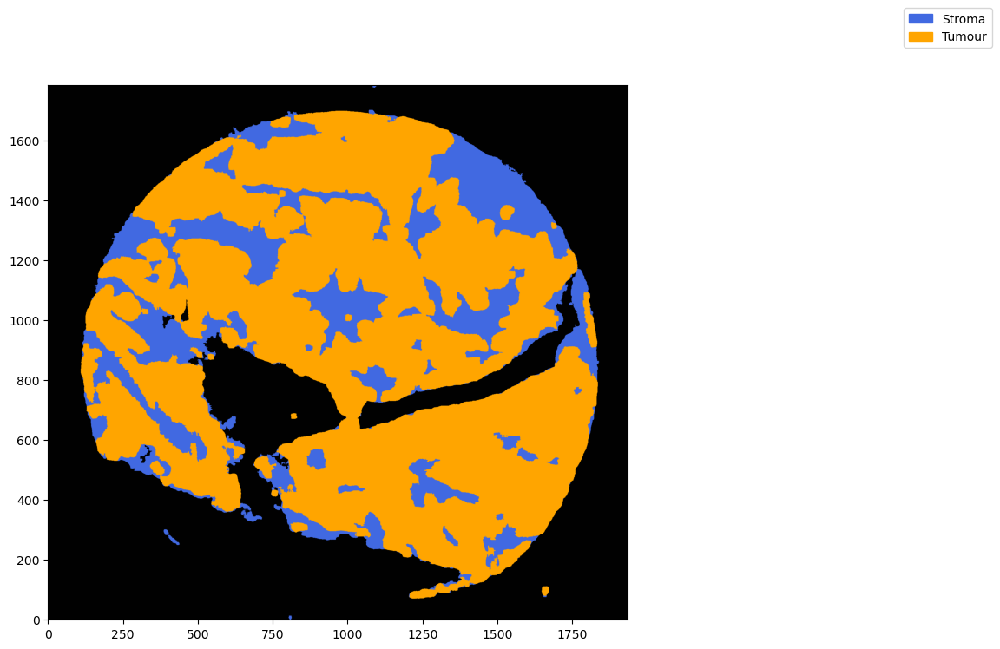

In [6]:
#### obtain masks
GM = masks.GetMasks(image_shape = (height, width))
GM.get_masks_T_S_empty(contours_tum = CTum.contours, contours_empty=CEmpty.contours, filter_area = 700)
# general masks 
mask_stroma_overall = GM.mask_S
mask_tumour_overall = GM.mask_T

# GM.plot_masks(masks=[GM.mask_S, GM.mask_T], mask_names = ['Stroma', 'Tumour'],
#           background_color=(1, 1, 1), mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},   # {'Stroma': (0, 0, 255), 'Tumour': (255, 0, 0)
#               path=None, show=True, ax=None)   

GM.plot_masks(masks=[GM.mask_S, GM.mask_T], mask_names=['Stroma', 'Tumour'],
              background_color=(1, 1, 1), mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},
              path=None, show=True, ax=None, figsize=(12, 8))

If you feel that the masks shoud be refined. you can use morphological operations 

In [7]:

# # To return the masks without setting them as instance's masks
# masks = GM.apply_morphological_operations(kernel_size=20, iterations=1, set_as_self=False)

# GM.plot_masks([masks['mask_T'], masks['mask_S']], mask_names=['Tumour', 'Stroma'],
#               background_color=(1, 1, 1), mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},
#               path=None, show=True, ax=None, figsize=(12, 8))


From these we can expand a mask of interest and check their surroundings. 

In this case we will expand the tumour mask and obtain the tumour border masks. 

the masks will be expansions of the Tumour mask in direction of the stroma mask. empty areas will be excluded. 

the expansion is given in pixels, so be aware, as in xenium the resolution is approx 1px = 1um so, expansions of 5,10,15,20 would be 5,10,15,20. In cosmx  would be approx. 43, 85, 128,170 px. 

the stroma mask from this analysis is the stroma minus the Tumour border 


INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000


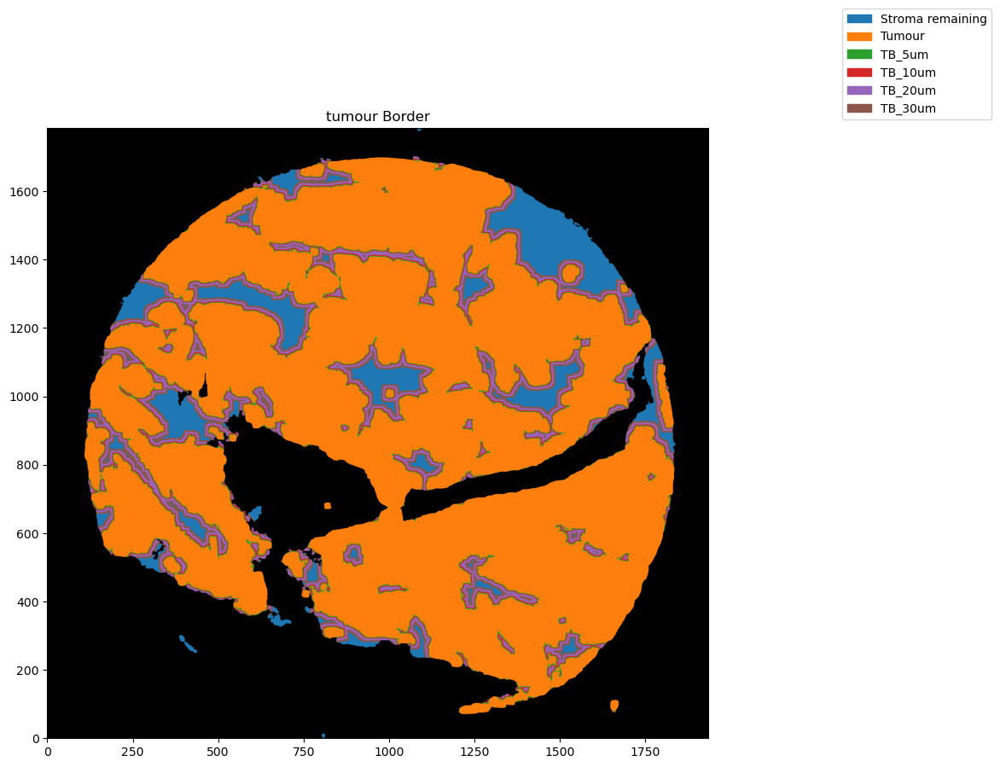

In [8]:
 #### tumour border analysis 
TA = masks.TumBorderAnalysis(GM)

TA.get_mask_tumour_border(expansions_pixels=[5,10,20,30], filter_area = 3000)
mask_stroma_tborder = TA.mask_S_tborder
mask_tumour_tborder = TA.mask_T_tborder # will be the same as T overall 
mask_TB_5px, mask_TB_10px,mask_TB_20px, mask_TB_30px = TA.mask_TB_tborders

GM.plot_masks(masks=[TA.mask_S_tborder,TA.mask_T_tborder,mask_TB_5px, mask_TB_10px,mask_TB_20px, mask_TB_30px],
              mask_names = ['Stroma remaining', 'Tumour', 'TB_5um', 'TB_10um','TB_20um','TB_30um'],
          background_color=(1, 1, 1), mask_colors=None, path=None, show=False, ax=None)
plt.title('tumour Border')
plt.show() 

Now that we have the masks we can extract the information from the masks 

We have several alternatives here. We can run this analysis:
    * per object ou per mask, where all the objects of each mask are agglomerated. Per object gets significantly slower. 
    * Get counts and morphological characteristics 
    * Get information of the objects in relation to other mask. For example the number of pixels in mask / stroma mask. and the hierarchy of the obects in relation to the expansions



To do this operations you need to open a class with ... 




first th masks will be labeled for consistensy. 
... 


This function will probably be significantly changed in the future

First, we will extract the counts counting all objects of each mask as a unified object. 

You need to set 'per_object':False on all masks

You can also check the counts that are in the masks and the counts in the df original. This may have slightly discrepancies due to counts on empty areas

In [9]:
%autoreload
from GRIDGEN.src.mask_propertiesV2 import GetMasksProperties


masks_analysis_tb = [
        {'mask': TA.mask_S_tborder, 'mask_name': 'Stroma_remaining', 'per_object': False, 'level_hierarchy': None},
        {'mask': TA.mask_T_tborder, 'mask_name': 'tumour_remaining', 'per_object': False, 'level_hierarchy': 1},
        {'mask': mask_TB_5px, 'mask_name': 'mask_TB_5um', 'per_object': False, 'level_hierarchy': 2},
        {'mask': mask_TB_10px, 'mask_name': 'mask_TB_10um', 'per_object': False, 'level_hierarchy': 2},
        {'mask': mask_TB_20px, 'mask_name': 'mask_TB_20um', 'per_object': False, 'level_hierarchy': 2},
        {'mask': mask_TB_30px, 'mask_name': 'mask_TB_30um', 'per_object': False, 'level_hierarchy': 2},
    ]

GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                        target_dict = target_dict_total,
                        logger = logger, image_shape = (height, width), save_path = None)

final_result = GP.get_gene_counts()
GP.check_counts()
final_result

2024-11-05 10:52:53,550 - contour_logger - INFO - The run method took 10.287241697311401 seconds (0.17145402828852335 minutes) to execute
INFO:contour_logger:The run method took 10.287241697311401 seconds (0.17145402828852335 minutes) to execute
INFO:root:Positive values in array: 4138092
INFO:root:Sum of DataFrame: 4082834
INFO:root:Counts difference: 55258


,area,perimeter,centroid,min_x,min_y,max_x,max_y,vertices,BoundingBox,NT5E,...,IFNE,TRDV1,CCL13,IFNB1,VPREB3,CCL1,ELANE,IGHE,mask_name,per_object
0,148140.0,12124.195811,"(1065.3566086134738, 1158.5371270419873)",0,120,1785,1841,148140,"[(120, 0, 1841, 1785)]",305,...,7,3,4,1,0,5,0,1,Stroma_remaining,False
1,1419775.0,34187.055501,"(1028.5143455829268, 929.4716599461183)",70,110,1700,1836,1419775,"[(110, 70, 1836, 1700)]",6119,...,65,7,51,20,3,26,9,3,tumour_remaining,False
2,62174.0,47604.248861,"(932.8040981760864, 924.4236015054524)",70,116,1696,1834,62174,"[(116, 70, 1834, 1696)]",119,...,5,1,2,1,0,0,2,1,mask_TB_5um,False
3,64833.0,43488.858136,"(928.1561396202551, 948.0314963058936)",75,115,1697,1834,64833,"[(115, 75, 1834, 1697)]",127,...,6,0,5,0,1,2,1,0,mask_TB_10um,False
4,99427.0,35779.031083,"(922.1022860993493, 970.2233095638006)",106,116,1702,1835,99427,"[(116, 106, 1835, 1702)]",191,...,6,1,7,0,0,3,3,0,mask_TB_20um,False
5,64704.0,23873.433073,"(931.9401273491593, 988.0594862759644)",226,120,1702,1836,64704,"[(120, 226, 1836, 1702)]",157,...,4,1,4,3,0,1,5,0,mask_TB_30um,False


When running GP, all masks are labbeled once for consistence of the numbered labels. IF save_path is not None, these images will be saved, otherwise they will not be saved. 

However, they can be easily plotted by using "plot_labeled_masks". One can also acess the "label_masks" in the dictionary.   

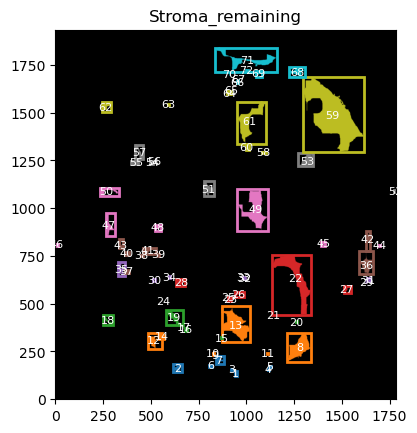

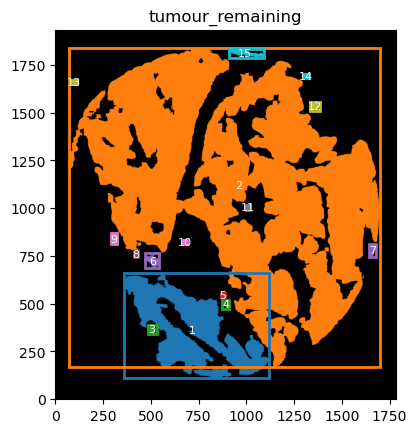

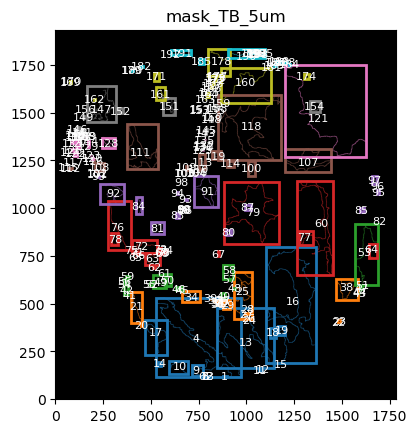

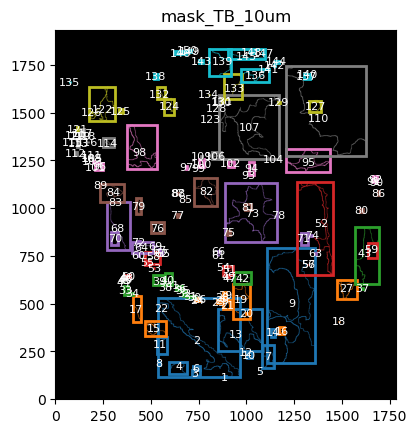

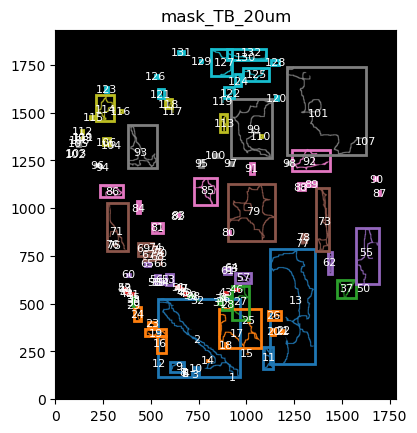

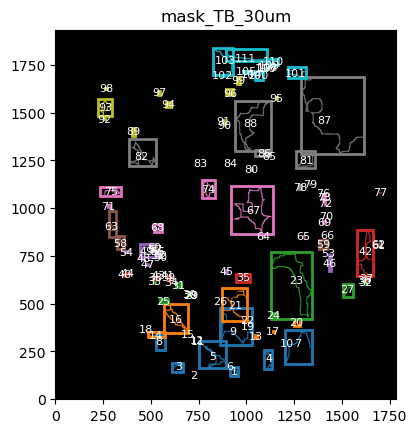

In [10]:
from GRIDGEN.src.mask_propertiesV2 import plot_labeled_masks
for mask_dict in GP.masks_dict:
    plot_labeled_masks(mask_dict, show=True)


To obtain the counts individually per object you can set per object as True. 
You can set per true only on the masks that you want to get info for the object individually. 
Be aware, having the counts per object will take significantly more time.

In [11]:
%autoreload
from GRIDGEN.src.mask_propertiesV2 import GetMasksProperties
masks_analysis_tb = [
        {'mask': TA.mask_S_tborder, 'mask_name': 'Stroma_remaining', 'per_object': False, 'level_hierarchy': None},
        {'mask': TA.mask_T_tborder, 'mask_name': 'tumour_remaining', 'per_object': True, 'level_hierarchy': 1},
        {'mask': mask_TB_5px, 'mask_name': 'mask_TB_5um', 'per_object': True, 'level_hierarchy': 2},
        {'mask': mask_TB_10px, 'mask_name': 'mask_TB_10um', 'per_object': True, 'level_hierarchy': 2},
        {'mask': mask_TB_20px, 'mask_name': 'mask_TB_20um', 'per_object': True, 'level_hierarchy': 2},
        {'mask': mask_TB_30px, 'mask_name': 'mask_TB_30um', 'per_object': True, 'level_hierarchy': 2},
    ]

GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                        target_dict = target_dict_total,
                        logger = logger, image_shape = (height, width), save_path = None)

final_result = GP.get_gene_counts()
final_result

2024-11-05 11:09:05,113 - contour_logger - INFO - The run method took 963.5096516609192 seconds (16.058494194348654 minutes) to execute
INFO:contour_logger:The run method took 963.5096516609192 seconds (16.058494194348654 minutes) to execute


,area,perimeter,centroid,min_x,min_y,max_x,max_y,vertices,BoundingBox,NT5E,...,TRDV1,CCL13,IFNB1,VPREB3,CCL1,ELANE,IGHE,mask_name,per_object,label
0,148140.0,12124.195811,"(1065.3566086134738, 1158.5371270419873)",0,120,1785,1841,148140,"[(120, 0, 1841, 1785)]",305,...,3,4,1,0,5,0,1,Stroma_remaining,False,NaN
1,169806.0,5962.288994,"(358.124754131185, 715.6673321319623)",359,110,1120,658,169806,"[(110, 359, 658, 1120)]",690,...,1,3,4,1,3,0,1,tumour_remaining,True,1
2,1232370.0,26107.315534,"(1119.6778459391255, 959.8070660597061)",70,168,1700,1836,1232370,"[(168, 70, 1836, 1700)]",5374,...,6,44,15,2,23,8,2,tumour_remaining,True,2
3,1554.0,171.4386,"(364.9472329472329, 505.27027027027026)",483,341,531,390,1554,"[(341, 483, 390, 531)]",5,...,0,0,1,0,0,0,0,tumour_remaining,True,3
4,794.0,156.39697,"(497.01007556675063, 891.3098236775819)",873,474,911,517,794,"[(474, 873, 517, 911)]",1,...,0,0,0,0,0,0,0,tumour_remaining,True,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603,1.0,0.0,"(1734.0, 1111.0)",1111,1734,1112,1735,1,"[(1734, 1111, 1735, 1112)]",0,...,0,0,0,0,0,0,0,mask_TB_30um,True,107
604,1.0,0.0,"(1735.0, 1113.0)",1113,1735,1114,1736,1,"[(1735, 1113, 1736, 1114)]",0,...,0,0,0,0,0,0,0,mask_TB_30um,True,108
605,1.0,0.0,"(1750.0, 1119.0)",1119,1750,1120,1751,1,"[(1750, 1119, 1751, 1120)]",0,...,0,0,0,0,0,0,0,mask_TB_30um,True,109
606,346.0,131.39697,"(1766.7485549132948, 1143.4913294797689)",1120,1751,1168,1783,346,"[(1751, 1120, 1783, 1168)]",1,...,0,0,0,0,0,0,0,mask_TB_30um,True,110


In [12]:
GP.check_counts()

INFO:root:Positive values in array: 4138092
INFO:root:Sum of DataFrame: 4082834
INFO:root:Counts difference: 55258


Finally if you want to get the object information from which tumour object each border cames, you can run an hierarchy analysis. 

In [13]:
# %autoreload
# final_result = GP.hierarchical_analysis()
# final_result

In [14]:
final_result['mask_name'].value_counts()

mask_name
mask_TB_5um         199
mask_TB_10um        150
mask_TB_20um        132
mask_TB_30um        111
tumour_remaining     15
Stroma_remaining      1
Name: count, dtype: int64

you can now define the parameters that best suit the full cohort to define the contours and run for all files int he cohort. 

Considerations: 

    probably set logger to write so a file with all the logging save to a report file ( get the file to a single core or do a single file for all the cohort is up to you) 
    save the images and plots that may be necessary for the analysis later. Plotting and save takes time, but in some cases may be saving time to prevent you to redo analysis to obtain a figure. 

    example code down ... 
    

  0%|                                                                                                                                                         | 0/3 [00:00<?, ?it/s]

Directory GRIDGEN_TMA1_Selection23_filtered/ created.
n genes: 480
shape: 1888, 1801
n hits 3299650
==== tumour ====
total contours found  135
total contours after filtering by area 41
====
total contours found  802
total contours after filtering by area 48


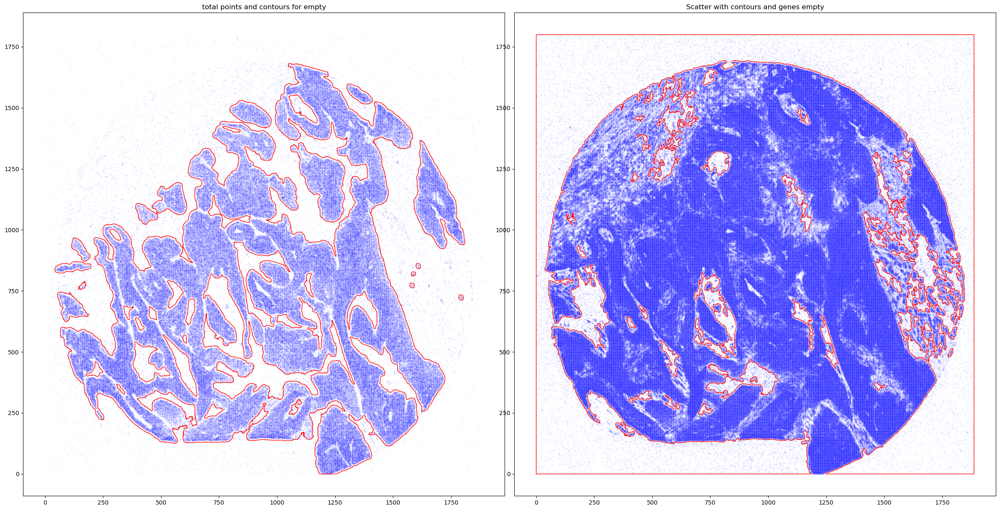

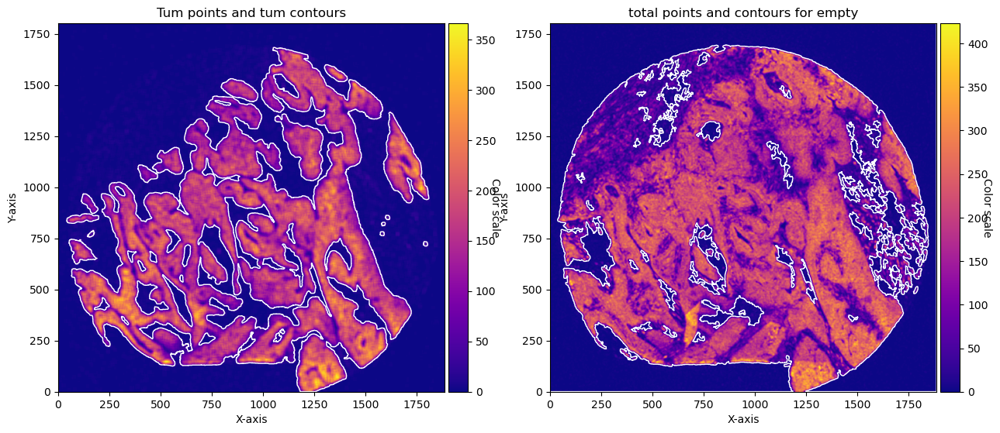

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Plot saved at GRIDGEN_TMA1_Selection23_filtered/masks_stromaremaining_tumour_tb_5um_tb_10um_tb_20um_tb_30um.png


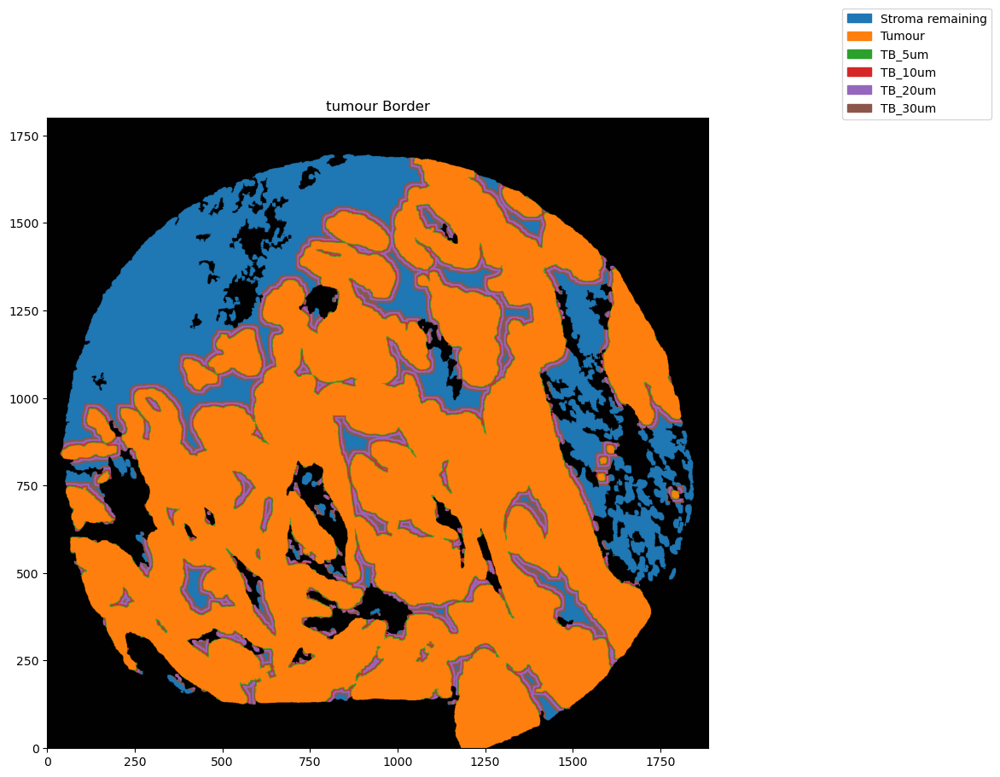

2024-11-05 11:09:30,238 - contour_logger - INFO - The run method took 10.445149183273315 seconds (0.17408581972122192 minutes) to execute
INFO:contour_logger:The run method took 10.445149183273315 seconds (0.17408581972122192 minutes) to execute
INFO:root:Positive values in array: 3225310
INFO:root:Sum of DataFrame: 3187531
INFO:root:Counts difference: 37779
 33%|████████████████████████████████████████████████▎                                                                                                | 1/3 [00:25<00:50, 25.04s/it]

Directory GRIDGEN_TMA1_Selection21_filtered/ created.
n genes: 480
shape: 1777, 1919
n hits 3716715
==== tumour ====
total contours found  441
total contours after filtering by area 54
====
total contours found  532
total contours after filtering by area 8


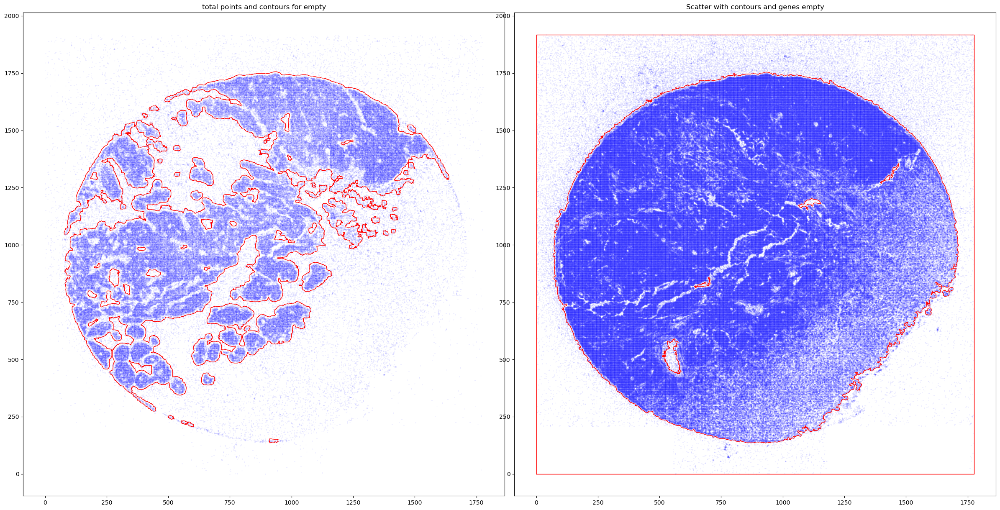

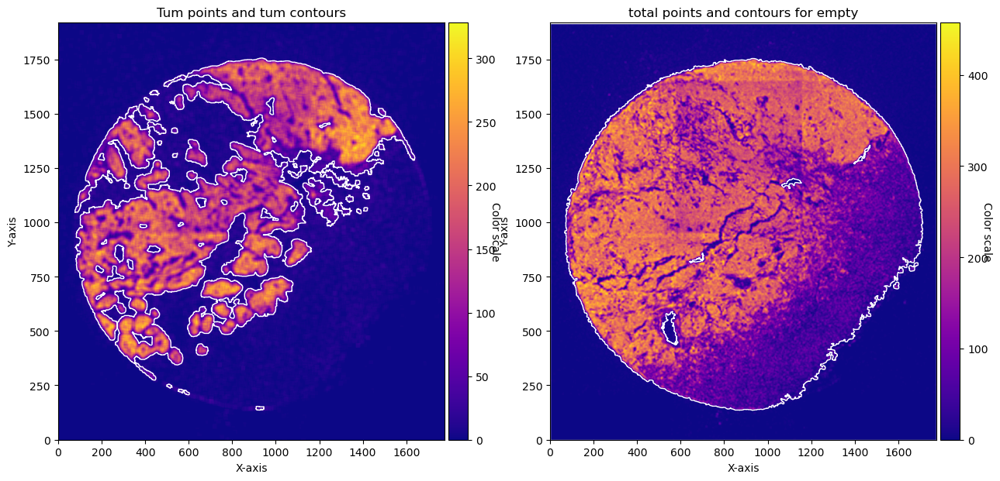

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Plot saved at GRIDGEN_TMA1_Selection21_filtered/masks_stromaremaining_tumour_tb_5um_tb_10um_tb_20um_tb_30um.png


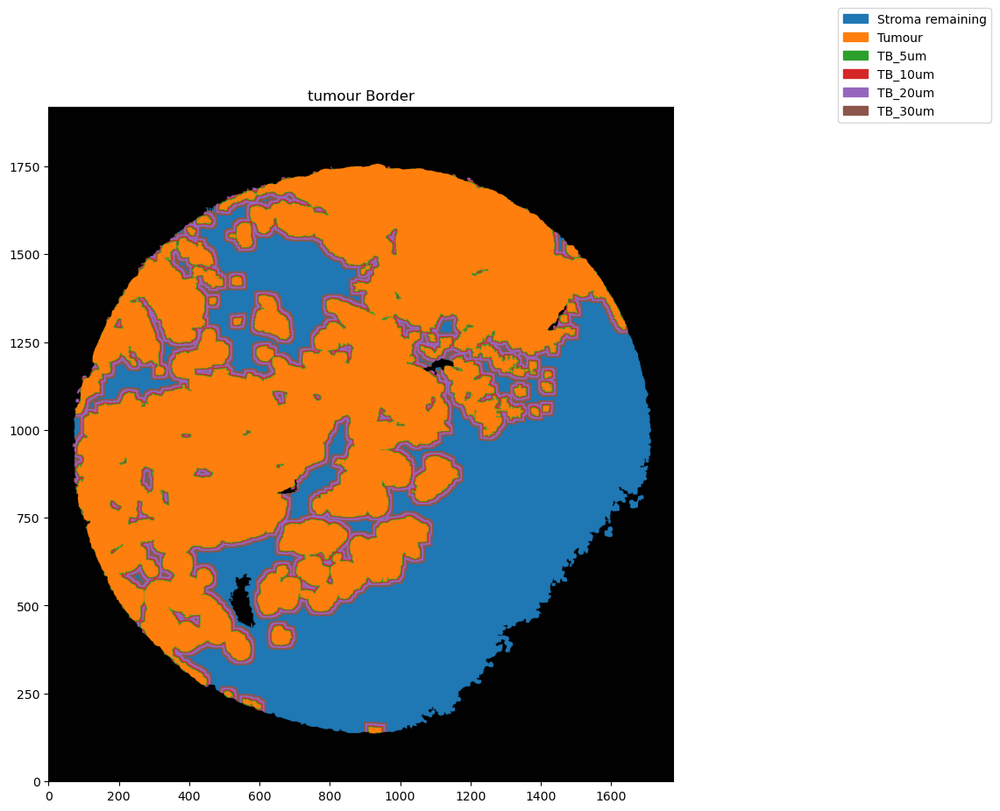

2024-11-05 11:09:55,894 - contour_logger - INFO - The run method took 10.446472883224487 seconds (0.17410788138707478 minutes) to execute
INFO:contour_logger:The run method took 10.446472883224487 seconds (0.17410788138707478 minutes) to execute
INFO:root:Positive values in array: 3654830
INFO:root:Sum of DataFrame: 3617733
INFO:root:Counts difference: 37097
 67%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2/3 [00:50<00:25, 25.40s/it]

Directory GRIDGEN_TMA1_Selection17_filtered/ created.
n genes: 480
shape: 1730, 1659
n hits 2181492
==== tumour ====
total contours found  111
total contours after filtering by area 14
====
total contours found  671
total contours after filtering by area 32


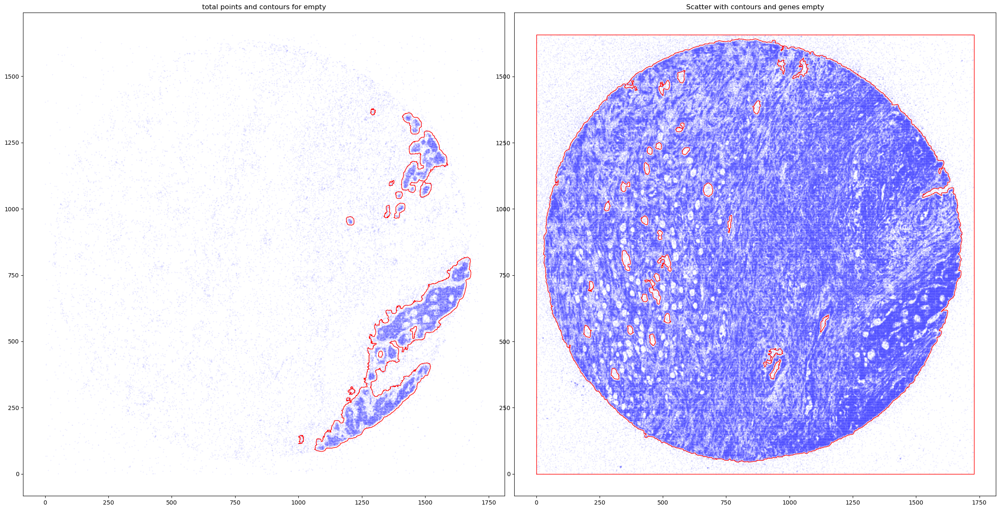

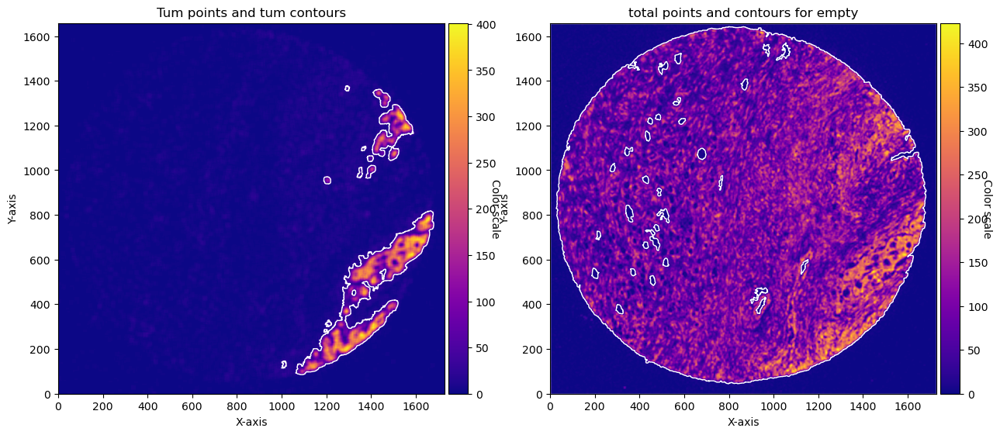

INFO:GRIDGEN.src.masks:Filtering stroma mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Plot saved at GRIDGEN_TMA1_Selection17_filtered/masks_stromaremaining_tumour_tb_5um_tb_10um_tb_20um_tb_30um.png


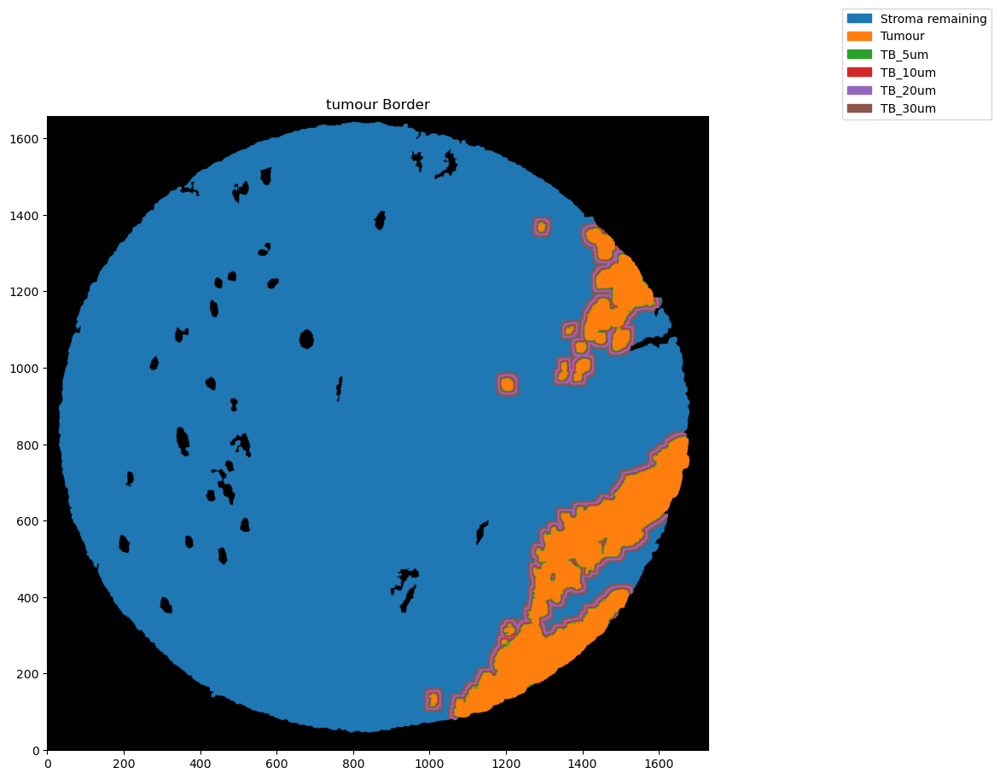

2024-11-05 11:10:17,090 - contour_logger - INFO - The run method took 8.822661399841309 seconds (0.1470443566640218 minutes) to execute
INFO:contour_logger:The run method took 8.822661399841309 seconds (0.1470443566640218 minutes) to execute
INFO:root:Positive values in array: 2134797
INFO:root:Sum of DataFrame: 2115295
INFO:root:Counts difference: 19502
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [01:11<00:00, 23.96s/it]


In [15]:
for file_csv in tqdm(files[:3]):
    start_time = time.time()
    
    df_total = pd.read_csv(file_csv)
    filename = os.path.basename(file_csv)
    name_part = os.path.splitext(filename)[0]

    save_path = f"GRIDGEN_{name_part}/"
    if not os.path.exists(save_path):
        os.makedirs(save_path)
        print(f"Directory {save_path} created.")
    else:
        print(f"Directory {save_path} already exists.")

    
    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

    n_genes = len(df_total['target'].unique())
    height = int(max(df_total['X'])) + 1
    width = int(max(df_total['Y'])) + 1

    print(f'n genes: {n_genes}')
    print(f'shape: {height}, {width}')
    print(f'n hits {len(df_total)}')

    # this makes the sparse df to an array with the spatial information 
    target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
    array_total = ga.transform_df_to_array(df = df_total, target_dict=target_dict_total, array_shape = (height, width,len(target_dict_total))).astype(np.int8)

    # creating subsets 
    df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(df_total, array_total,target_dict_total,
                                                                         target_list=target_tum, target_col = 'target')
    
    # obtain contours 
    CTum = contours.GetContour(array_subset_tum, contour_name='tum')
    CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
    CTum.contours_from_sum(density_threshold = density_th_tum,
                           min_area_threshold = min_area_th_tum , directionality = 'higher')
    
    CEmpty = contours.GetContour(array_total, contour_name='empty')
    CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
    CEmpty.contours_from_sum(density_threshold = density_th_empty,
                           min_area_threshold = min_area_th_empty, directionality = 'lower') # attention that directionality is lower here 
    
    print('==== tumour ====')
    print('total contours found ', CTum.total_valid_contours)
    print('total contours after filtering by area', CTum.contours_filtered_area)

    print('====')
    print('total contours found ', CEmpty.total_valid_contours)
    print('total contours after filtering by area', CEmpty.contours_filtered_area)
    
    # PLOTs
    
    fig, axs = plt.subplots(1, 2, figsize=(30, 15))
    CTum.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                               c_points= 'blue',c_contours= 'red', ax=axs[0])
    axs[0].set_title('Tum points and tum contours')  


    CEmpty.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                               c_points= 'blue',c_contours= 'red', ax=axs[1])
    axs[0].set_title('total points and contours for empty')  
    plt.subplots_adjust(wspace=0.02)  # Adjust to your preference

    plt.show()
       

    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    CTum.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[0])
    axs[0].set_title('Tum points and tum contours')

    CEmpty.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[1])
    axs[1].set_title('total points and contours for empty')

    plt.show()



    #### obtain masks
    GM = masks.GetMasks(image_shape = (height, width))
    GM.get_masks_T_S_empty(contours_tum = CTum.contours, contours_empty=CEmpty.contours, filter_area = 700)
    # general masks 
    mask_stroma_overall = GM.mask_S
    mask_tumour_overall = GM.mask_T

     #### tumour border analysis 
    TA = masks.TumBorderAnalysis(GM)
    
    TA.get_mask_tumour_border(expansions_pixels=[5,10,20,30], filter_area = 3000)
    mask_stroma_tborder = TA.mask_S_tborder
    mask_tumour_tborder = TA.mask_T_tborder # will be the same as T overall 
    mask_TB_5px, mask_TB_10px,mask_TB_20px, mask_TB_30px = TA.mask_TB_tborders
    
    GM.plot_masks(masks=[TA.mask_S_tborder,TA.mask_T_tborder,mask_TB_5px, mask_TB_10px,mask_TB_20px, mask_TB_30px],
                  mask_names = ['Stroma remaining', 'Tumour', 'TB_5um', 'TB_10um','TB_20um','TB_30um'],
              background_color=(1, 1, 1), mask_colors=None, path=save_path, show=False, ax=None)
    plt.title('tumour Border')
    plt.show() 
       
    
    masks_analysis_tb = [
            {'mask': TA.mask_S_tborder, 'mask_name': 'Stroma_remaining', 'per_object': False, 'level_hierarchy': None},
            {'mask': TA.mask_T_tborder, 'mask_name': 'tumour_remaining', 'per_object': False, 'level_hierarchy': 1},
            {'mask': mask_TB_5px, 'mask_name': 'mask_TB_5um', 'per_object': False, 'level_hierarchy': 2},
            {'mask': mask_TB_10px, 'mask_name': 'mask_TB_10um', 'per_object': False, 'level_hierarchy': 2},
            {'mask': mask_TB_20px, 'mask_name': 'mask_TB_20um', 'per_object': False, 'level_hierarchy': 2},
            {'mask': mask_TB_30px, 'mask_name': 'mask_TB_30um', 'per_object': False, 'level_hierarchy': 2},
        ]
    
    GP = GetMasksProperties(masks_dict = masks_analysis_tb,array_counts = array_total,
                            target_dict = target_dict_total,
                            logger = logger, image_shape = (height, width), save_path = None)
    
    final_result = GP.get_gene_counts()
    GP.check_counts()
